Load dataset

In [2]:
import pandas as pd
df = pd.read_csv('data.csv')
df_line2 = df.loc[df['ln_id'] == 2] # Line 2
print(df)
print(df_line2.info())
print(df_line2.describe())

       ln_id  statn_id     dta_strt_tm      dta_end_tm  in_flx_nr  out_flx_nr  \
0          2       247  20210101000000  20210101000459         22          26   
1          2       247  20210101000500  20210101000959         52           0   
2          2       247  20210101001000  20210101001459         51          21   
3          2       247  20210101001500  20210101001959         80          10   
4          2       247  20210101002000  20210101002459         43          14   
...      ...       ...             ...             ...        ...         ...   
99994      2       247  20220212182500  20220212182959        257         107   
99995     14      1438  20220212183000  20220212183459         59          34   
99996      2       247  20220212183000  20220212183459        247         103   
99997     14      1438  20220212183500  20220212183959         61          17   
99998      2       247  20220212183500  20220212183959        226         134   

         dta_tm  
0      20

Get dates

In [3]:
days = list(df_line2['dta_tm'])
days = sorted(list(set(days)))[:-1]
print(len(days),days[0],days[-1])

402 20210101 20220211


Get daily data from 6:00 to 23:00

In [4]:
data_dict = {str(d):dict() for d in days}
for day in days:
    d = df_line2.loc[df['dta_tm'] == day]
    dtms = list(d['dta_strt_tm'])
    tms = [str(t)[8:] for t in dtms]
    imin = tms.index('060000')
    imax = tms.index('230000')
    dtms = dtms[imin:imax+1]
    d_in = list(d['in_flx_nr'])[imin:imax+1]
    d_out = list(d['out_flx_nr'])[imin:imax+1]
    data_dict[str(day)]['in'] = d_in
    data_dict[str(day)]['out'] = d_out
    d_all = [d_in[i]+d_out[i] for i in range(len(d_in))]
    data_dict[str(day)]['all'] = d_all

x_in = []
x_out = []
x_all = []
for d in days:
    x_in.append(data_dict[str(d)]['in'])
    x_out.append(data_dict[str(d)]['out'])
    x_all.append(data_dict[str(d)]['all'])

tms = []
for i in range(6,23):
    for j in range(0,60,5):
        tms.append(str(i).zfill(2)+':'+str(j).zfill(2))
tms.append('23:00')

Visualization

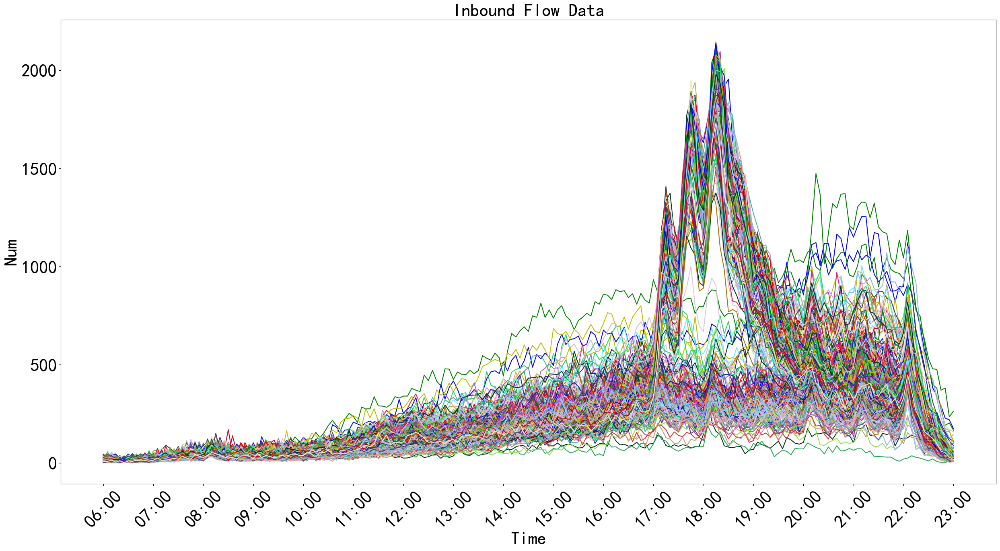

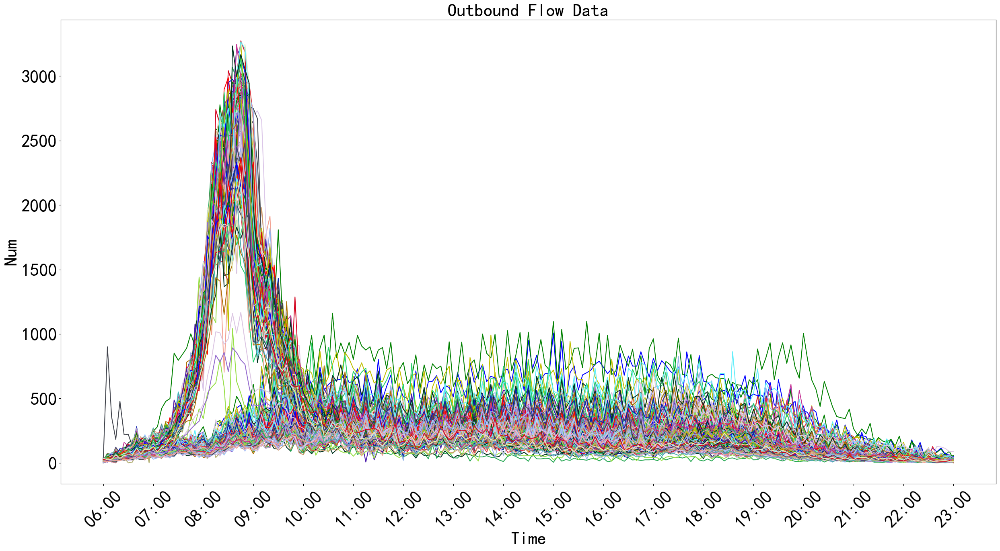

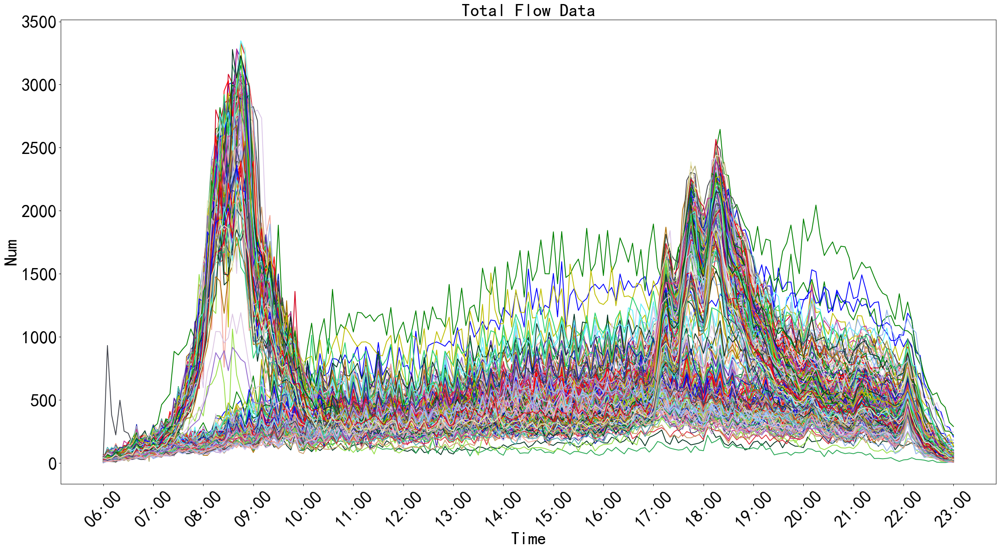

In [16]:
import warnings
warnings.filterwarnings("ignore")
import seaborn as sns
import matplotlib.pyplot as plt
color=[
'r',
'b',
'g',
'y',
'#C43394',
'#DB2E3A',
'#D4BBDF',
'#64EEFA',
'#26D16C',
'#023320',
'#AE6F05',
'#DCC6E3',
'#946ACE',
'#CB9A6B',
'#A2CAFF',
'#B597CD',
'#DBC6E8',
'#41444C',
'#93B3EA',
'#F3A292',
'#4FABAC',
'#424173',
'#B0AC6F',
'#D3031F',
'#E9ECC1',
'#4919AB',
'#27A854',
'#97DF47',
'#0722AE',
]

plt.rcParams.update({"font.size":20})
plt.figure(1,figsize=(30,15))
x_major_locator=plt.MultipleLocator(12)
ax=plt.gca()
ax.xaxis.set_major_locator(x_major_locator)
plt.title("Inbound Flow Data",fontsize=32)
plt.xlabel("Time",fontsize=32)
plt.ylabel("Num",fontsize=32)
plt.xticks(fontsize=32,rotation=45)
plt.yticks(fontsize=32)
for i in range(len(x_in)):
    c = color[i%len(color)]
    sns.lineplot(x=tms,y=x_in[i],color=c)
plt.savefig('./resources/all_inbound_flow.jpg')
plt.show()

plt.figure(1,figsize=(30,15))
x_major_locator=plt.MultipleLocator(12)
ax=plt.gca()
ax.xaxis.set_major_locator(x_major_locator)
plt.title("Outbound Flow Data",fontsize=32)
plt.xlabel("Time",fontsize=32)
plt.ylabel("Num",fontsize=32)
plt.xticks(fontsize=32,rotation=45)
plt.yticks(fontsize=32)
for i in range(len(x_out)):
    c = color[i%len(color)]
    sns.lineplot(x=tms,y=x_out[i],color=c)
plt.savefig('./resources/all_outbound_flow.jpg')
plt.show()

plt.figure(1,figsize=(30,15))
x_major_locator=plt.MultipleLocator(12)
ax=plt.gca()
ax.xaxis.set_major_locator(x_major_locator)
plt.title("Total Flow Data",fontsize=32)
plt.xlabel("Time",fontsize=32)
plt.ylabel("Num",fontsize=32)
plt.xticks(fontsize=32,rotation=45)
plt.yticks(fontsize=32)
for i in range(len(x_all)):
    c = color[i%len(color)]
    sns.lineplot(x=tms,y=x_all[i],color=c)
plt.savefig('./resources/all_total_flow.jpg')
plt.show()

Remove abnormal data

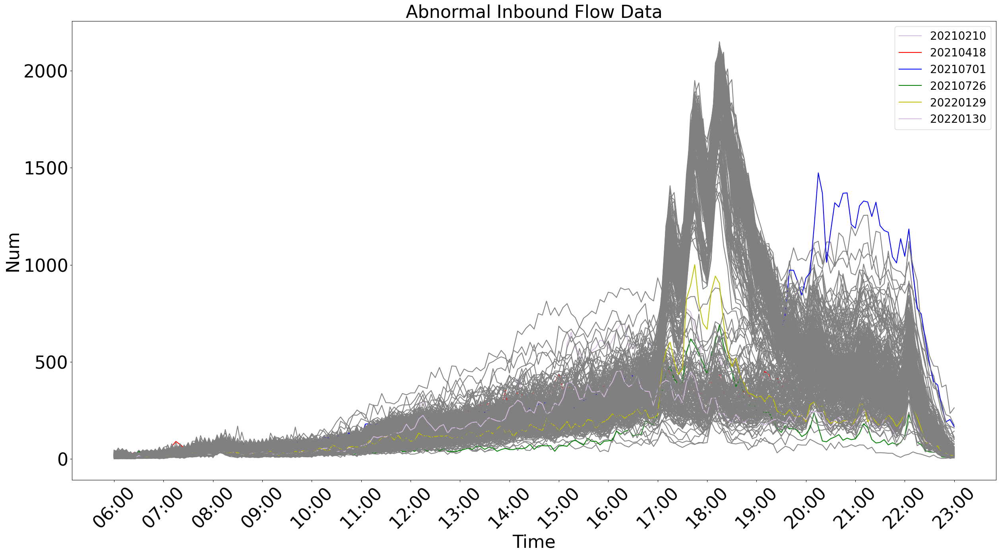

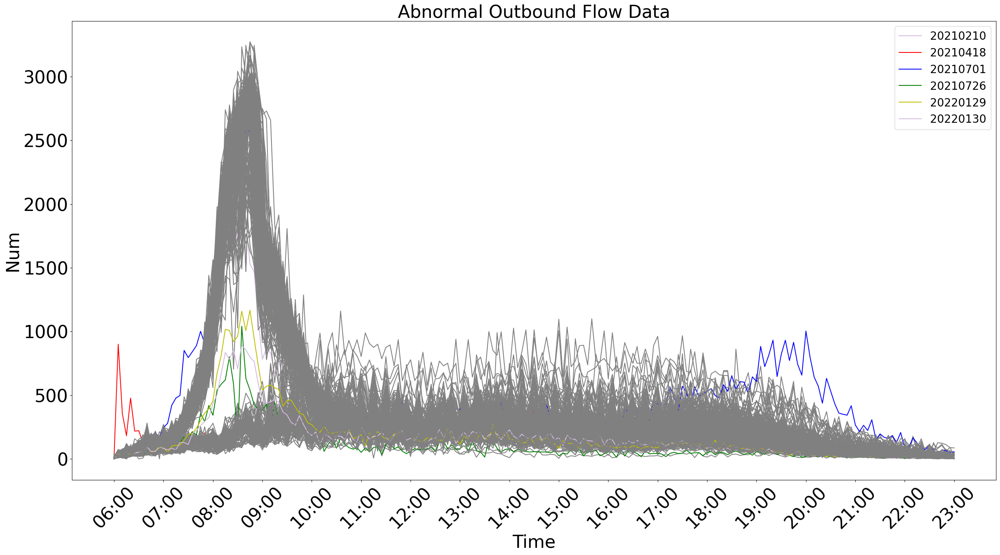

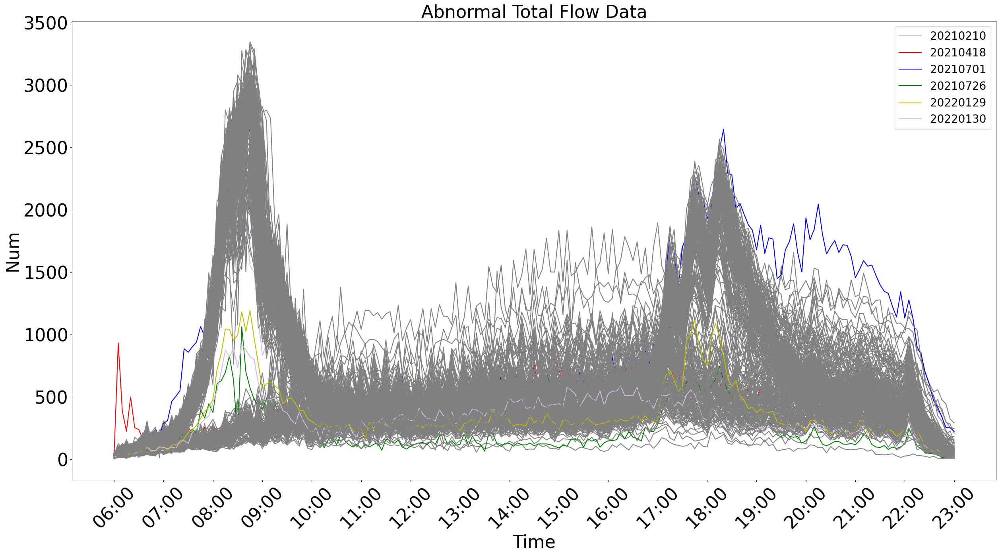

396 20210101 20220211


In [5]:
# 20210418 A marathon race was held.
# 20210701 A big event was held.
# 20210726 Typhoon.
# 20220129 20220130 20210210 Approaching important festivals
keys = [20210418,20210701,20210726,20220129,20220130,20210210]

import warnings
warnings.filterwarnings("ignore")
import seaborn as sns
import matplotlib.pyplot as plt

color=['r','b','g','y','#D4BBDF','#D4BBDF','#D4BBDF','#0722AE',]
tms = []
for i in range(6,23):
    for j in range(0,60,5):
        tms.append(str(i).zfill(2)+':'+str(j).zfill(2))
tms.append('23:00')

plt.figure(1,figsize=(30,15))
x_major_locator=plt.MultipleLocator(12)
ax=plt.gca()
ax.xaxis.set_major_locator(x_major_locator)
plt.rcParams.update({"font.size":20})
plt.title("Abnormal Inbound Flow Data",fontsize=32)
plt.xlabel("Time",fontsize=32)
plt.ylabel("Num",fontsize=32)
plt.xticks(fontsize=32,rotation=45)
plt.yticks(fontsize=32)
for i in range(len(x_in)):
    if keys.count(days[i])>0:
        c = color[keys.index(days[i])]
        sns.lineplot(x=tms,y=x_in[i],color=c,label=days[i])
    else:
        c= 'grey'     
        sns.lineplot(x=tms,y=x_in[i],color=c)
plt.savefig('./resources/abnormal_in_flow.jpg')
plt.show()

plt.figure(1,figsize=(30,15))
x_major_locator=plt.MultipleLocator(12)
ax=plt.gca()
ax.xaxis.set_major_locator(x_major_locator)
plt.rcParams.update({"font.size":20})
plt.title("Abnormal Outbound Flow Data",fontsize=32)
plt.xlabel("Time",fontsize=32)
plt.ylabel("Num",fontsize=32)
plt.xticks(fontsize=32,rotation=45)
plt.yticks(fontsize=32)
for i in range(len(x_out)):
    if keys.count(days[i])>0:
        c = color[keys.index(days[i])]
        sns.lineplot(x=tms,y=x_out[i],color=c,label=days[i])
    else:
        c= 'grey'     
        sns.lineplot(x=tms,y=x_out[i],color=c)
plt.savefig('./resources/abnormal_out_flow.jpg')
plt.show()

plt.figure(1,figsize=(30,15))
x_major_locator=plt.MultipleLocator(12)
ax=plt.gca()
ax.xaxis.set_major_locator(x_major_locator)
plt.rcParams.update({"font.size":20})
plt.title("Abnormal Total Flow Data",fontsize=32)
plt.xlabel("Time",fontsize=32)
plt.ylabel("Num",fontsize=32)
plt.xticks(fontsize=32,rotation=45)
plt.yticks(fontsize=32)
for i in range(len(x_all)):
    if keys.count(days[i])>0:
        c = color[keys.index(days[i])]
        sns.lineplot(x=tms,y=x_all[i],color=c,label=days[i])
    else:
        c= 'grey'
        sns.lineplot(x=tms,y=x_all[i],color=c)
plt.savefig('./resources/abnormal_total_flow.jpg')
plt.show()

for k in keys:
    days.remove(k)
print(len(days),days[0],days[-1])

Get daily data from 6:00 to 23:00 without abnormal data

In [7]:
data_dict = {str(d):dict() for d in days}
for day in days:
    d = df_line2.loc[df['dta_tm'] == day]
    d['in_ma5'] = d['in_flx_nr'].rolling(window=3).mean()
    d['in_ma10'] = d['in_flx_nr'].rolling(window=10).mean()
    d['in_ma15'] = d['in_flx_nr'].rolling(window=15).mean()
    d['out_ma5'] = d['out_flx_nr'].rolling(window=3).mean()
    d['out_ma10'] = d['out_flx_nr'].rolling(window=10).mean()
    d['out_ma15'] = d['out_flx_nr'].rolling(window=15).mean()
    d.fillna(0,inplace = True)
    dtms = list(d['dta_strt_tm'])
    tms = [str(t)[8:] for t in dtms]
    imin = tms.index('060000')
    imax = tms.index('230000')
    dtms = dtms[imin:imax+1]
    d_in = list(d['in_flx_nr'])[imin:imax+1]
    d_out = list(d['out_flx_nr'])[imin:imax+1]
    d_in_ma5 = list(d['in_ma5'])[imin:imax+1]
    d_in_ma10 = list(d['in_ma10'])[imin:imax+1]
    d_in_ma15 = list(d['in_ma15'])[imin:imax+1]
    d_out_ma5 = list(d['out_ma5'])[imin:imax+1]
    d_out_ma10 = list(d['out_ma10'])[imin:imax+1]
    d_out_ma15 = list(d['out_ma15'])[imin:imax+1]
    d_all = [d_in[i]+d_out[i] for i in range(len(d_in))]
    d_all_ma5 = [d_in_ma5[i]+d_out_ma5[i] for i in range(len(d_in_ma5))]
    d_all_ma10 = [d_in_ma5[i]+d_out_ma5[i] for i in range(len(d_in_ma10))]
    d_all_ma15 = [d_in_ma5[i]+d_out_ma5[i] for i in range(len(d_in_ma15))]
    data_dict[str(day)]['in'] = d_in
    data_dict[str(day)]['out'] = d_out
    data_dict[str(day)]['in_ma5'] = d_in_ma5
    data_dict[str(day)]['in_ma10'] = d_in_ma10
    data_dict[str(day)]['in_ma15'] = d_in_ma15
    data_dict[str(day)]['out_ma5'] = d_out_ma5
    data_dict[str(day)]['out_ma10'] = d_out_ma10
    data_dict[str(day)]['out_ma15'] = d_out_ma15
    data_dict[str(day)]['all'] = d_all
    data_dict[str(day)]['all_ma5'] = d_all_ma5
    data_dict[str(day)]['all_ma10'] = d_all_ma10
    data_dict[str(day)]['all_ma15'] = d_all_ma15
                                                         
x_in = []
x_out = []
x_in_ma5 = []
x_in_ma10 = []
x_in_ma15 = []
x_out_ma5 = []
x_out_ma10 = []
x_out_ma15 = []
x_all = []
x_all_ma5 = []
x_all_ma10 = []
x_all_ma15 = []
for d in days:
    x_in.append(data_dict[str(d)]['in'])
    x_out.append(data_dict[str(d)]['out'])
    x_in_ma5.append(data_dict[str(d)]['in_ma5'])
    x_in_ma10.append(data_dict[str(d)]['in_ma10'])
    x_in_ma15.append(data_dict[str(d)]['in_ma15'])
    x_out_ma5.append(data_dict[str(d)]['out_ma5'])
    x_out_ma10.append(data_dict[str(d)]['out_ma10'])
    x_out_ma15.append(data_dict[str(d)]['out_ma15'])
    x_all.append(data_dict[str(d)]['all'])
    x_all_ma5.append(data_dict[str(d)]['all_ma5'])
    x_all_ma10.append(data_dict[str(d)]['all_ma10'])
    x_all_ma15.append(data_dict[str(d)]['all_ma15'])
    
print(len(x_in),len(x_in[0]))

396 205


Moving average smoothing

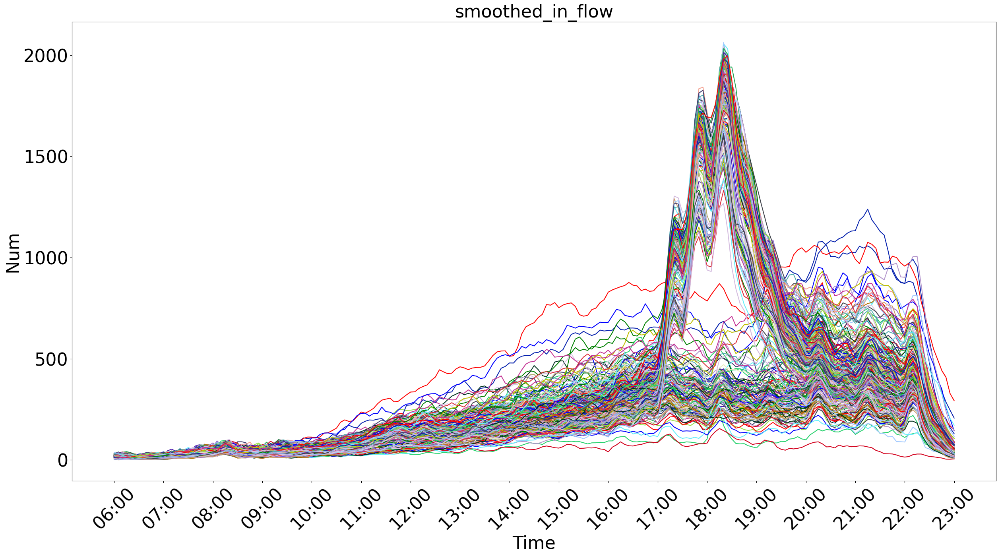

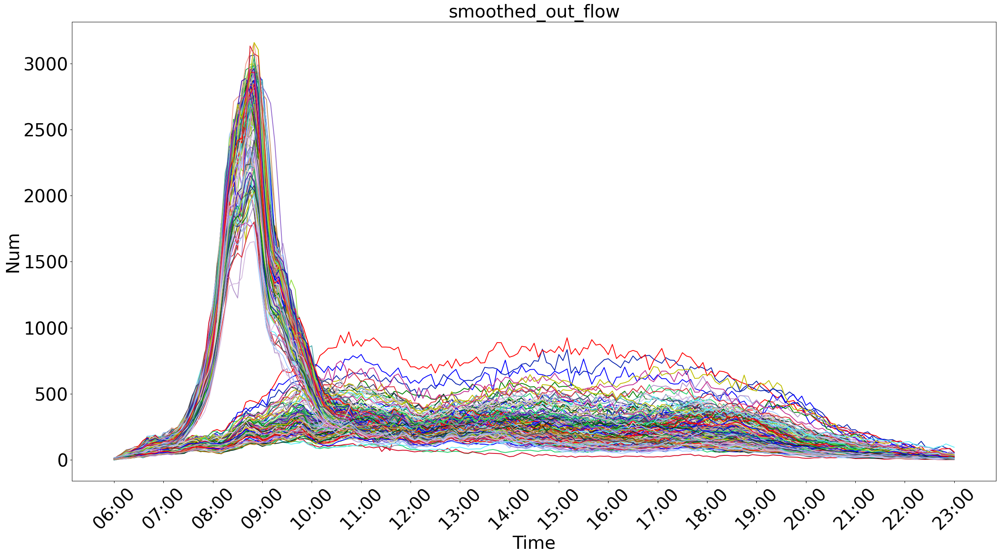

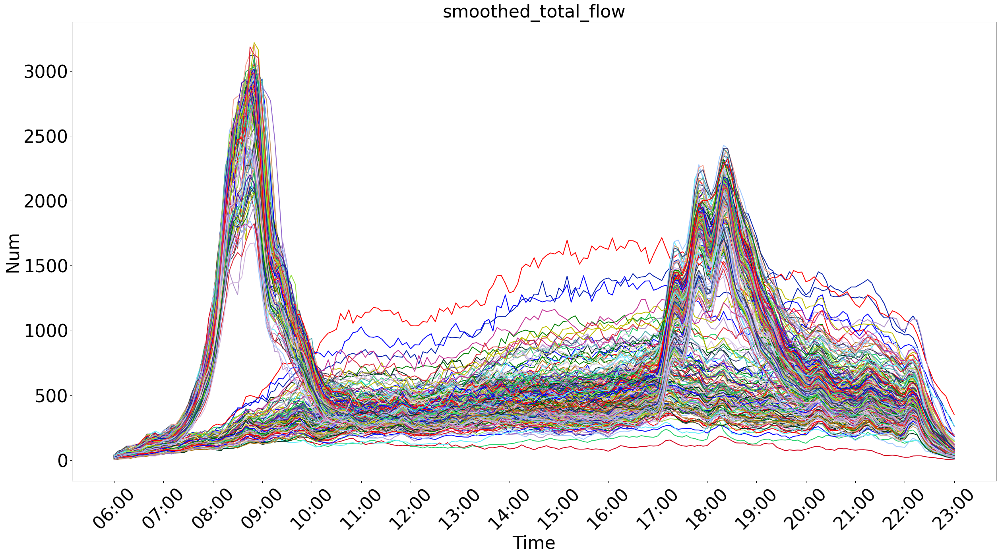

In [8]:
color=[
'r',
'b',
'g',
'y',
'#C43394',
'#DB2E3A',
'#D4BBDF',
'#64EEFA',
'#26D16C',
'#023320',
'#AE6F05',
'#DCC6E3',
'#946ACE',
'#CB9A6B',
'#A2CAFF',
'#B597CD',
'#DBC6E8',
'#41444C',
'#93B3EA',
'#F3A292',
'#4FABAC',
'#424173',
'#B0AC6F',
'#D3031F',
'#E9ECC1',
'#4919AB',
'#27A854',
'#97DF47',
'#0722AE',
]
tms = []
for i in range(6,23):
    for j in range(0,60,5):
        tms.append(str(i).zfill(2)+':'+str(j).zfill(2))
tms.append('23:00')
def show(x, name):
    plt.rcParams.update({"font.size":20})
    plt.figure(1,figsize=(30,15))
    x_major_locator=plt.MultipleLocator(12)
    ax=plt.gca()
    ax.xaxis.set_major_locator(x_major_locator)
    plt.title(name,fontsize=32)
    plt.xlabel("Time",fontsize=32)
    plt.ylabel("Num",fontsize=32)
    plt.xticks(fontsize=32,rotation=45)
    plt.yticks(fontsize=32)
    for i in range(len(x)):
        c = color[i%len(color)]
        sns.lineplot(x=tms,y=x[i],color=c)
    plt.savefig(f'./resources/{name}.jpg')
    plt.show()

show(x_in_ma5, 'smoothed_in_flow')
show(x_out_ma5, 'smoothed_out_flow')
show(x_all_ma5, 'smoothed_total_flow')

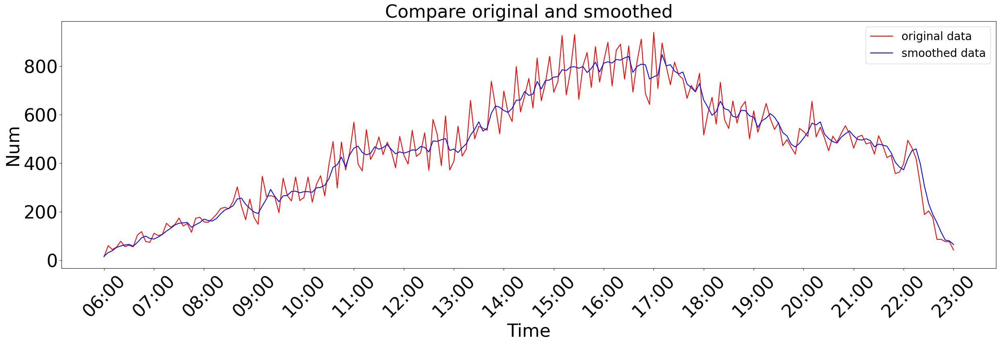

In [9]:
def compare(x1, x2, name):
    plt.rcParams.update({"font.size":20})
    plt.figure(1,figsize=(30,8))
    x_major_locator=plt.MultipleLocator(12)
    ax=plt.gca()
    ax.xaxis.set_major_locator(x_major_locator)
    plt.title(name,fontsize=32)
    plt.xlabel("Time",fontsize=32)
    plt.ylabel("Num",fontsize=32)
    plt.xticks(fontsize=32,rotation=45)
    plt.yticks(fontsize=32)
    sns.lineplot(x=tms,y=x1,color=color[0],label='original data')
    sns.lineplot(x=tms,y=x2,color=color[1],label='smoothed data')
    plt.show()
compare(x_all[0],x_all_ma5[0], 'Compare original and smoothed')

Select clustering algorithm according to silhouette 

KMeans: 分2类，score 0.7480588307491779，每类个数 [268, 128]
KMeans: 分3类，score 0.7016937200878705，每类个数 [23, 268, 105]
KMeans: 分4类，score 0.6595062209816491，每类个数 [63, 268, 49, 16]
KMeans: 分5类，score 0.4246963533212615，每类个数 [156, 30, 37, 98, 75]
KMeans: 分6类，score 0.40617275155003263，每类个数 [98, 159, 25, 30, 27, 57]
KMeans: 分7类，score 0.3511058562318173，每类个数 [63, 107, 16, 49, 22, 102, 37]
KMeans: 分8类，score 0.29959556055303155，每类个数 [79, 54, 64, 19, 37, 10, 65, 68]
KMeans: 分9类，score 0.3462858589319229，每类个数 [47, 102, 37, 16, 62, 107, 1, 3, 21]
KMeans: 分10类，score 0.25013041654538176，每类个数 [63, 53, 16, 26, 60, 39, 19, 22, 78, 20]


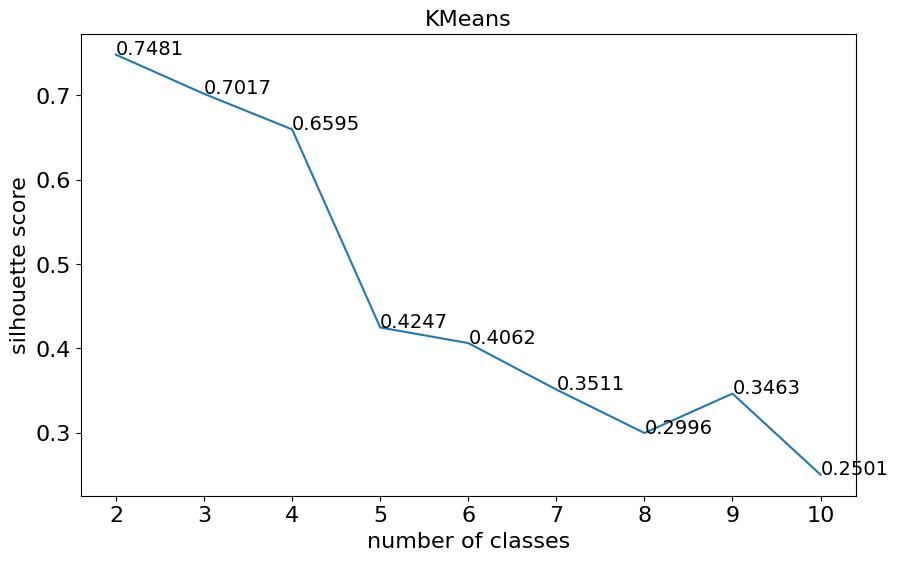

Hierarchical: 分2类，score 0.7480588307491779，每类个数 [128, 268]
Hierarchical: 分3类，score 0.7077591767423732，每类个数 [268, 109, 19]
Hierarchical: 分4类，score 0.5283780315999999，每类个数 [218, 109, 19, 50]
Hierarchical: 分5类，score 0.4324999912310185，每类个数 [109, 69, 19, 50, 149]
Hierarchical: 分6类，score 0.3818917571671248，每类个数 [19, 69, 65, 50, 149, 44]
Hierarchical: 分7类，score 0.3847704972779985，每类个数 [69, 50, 65, 16, 149, 44, 3]
Hierarchical: 分8类，score 0.356489750343971，每类个数 [50, 149, 65, 16, 55, 44, 3, 14]
Hierarchical: 分9类，score 0.33657556904971647，每类个数 [65, 149, 37, 16, 55, 44, 3, 14, 13]
Hierarchical: 分10类，score 0.2878620498643935，每类个数 [37, 149, 44, 16, 55, 39, 3, 14, 13, 26]


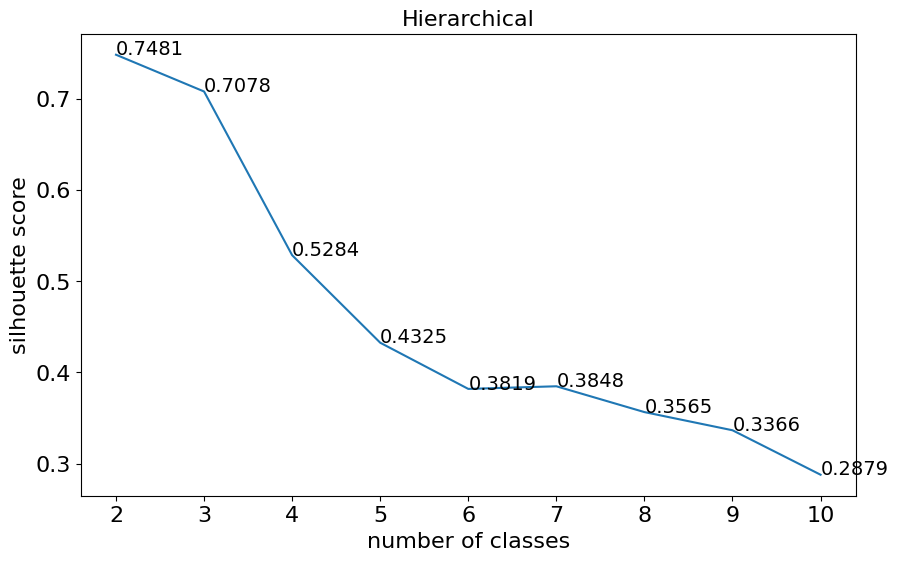

In [13]:
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.metrics import silhouette_score 
silhouettescore=[[],[],[],[]]

def lunkuo(Model, x, name):
    score = []
    for i in range(2,11):
        model = Model(n_clusters=i).fit(x)
        labels=list(model.labels_)
        score.append(silhouette_score(x,model.labels_))
        counts = []
        for j in range(i):
            counts.append(labels.count(j))
        print(f'{name}: 分{i}类，score {score[-1]}，每类个数 {counts}')
    plt.rcParams.update({"font.size":20})
    plt.figure(1,figsize=(10,6))
    fontsize=16
    plt.title(name,fontsize=fontsize)
    plt.xlabel("number of classes",fontsize=fontsize)
    plt.ylabel("silhouette score",fontsize=fontsize)
    plt.xticks(fontsize=fontsize)
    plt.yticks(fontsize=fontsize)
    plt.plot(range(2,11),score,linewidth=1.5,linestyle='-')
    for x,y in zip(range(2,11),score):
        plt.text(x,y,'%.4f' % y,fontdict={'fontsize':14})
    plt.savefig(f'./resources/{name}.jpg')
    plt.show()
    
# lunkuo(KMeans,x_in,'KMeans-进站客流')
# lunkuo(KMeans,x_in_ma5,'KMeans-进站客流 ma5')
# lunkuo(KMeans,x_in_ma10,'KMeans-进站客流 ma10')
# lunkuo(KMeans,x_in_ma15,'KMeans-进站客流 ma15')
# lunkuo(KMeans,x_out,'KMeans-出站客流')
# lunkuo(KMeans,x_out_ma5,'KMeans-出站客流 ma5')
# lunkuo(KMeans,x_out_ma10,'KMeans-出站客流 ma10')
# lunkuo(KMeans,x_out_ma15,'KMeans-出站客流 ma15')
lunkuo(KMeans,x_all_ma5,'KMeans')
# lunkuo(KMeans,x_all_ma5,'KMeans-总客流 ma5')
# lunkuo(KMeans,x_all_ma10,'KMeans-总客流 ma10')
# lunkuo(KMeans,x_all_ma15,'KMeans-总客流 ma15')

# lunkuo(AgglomerativeClustering,x_in,'层次聚类-进站客流')
# lunkuo(AgglomerativeClustering,x_in_ma5,'层次聚类-进站客流 ma5')
# lunkuo(AgglomerativeClustering,x_in_ma10,'层次聚类-进站客流 ma10')
# lunkuo(AgglomerativeClustering,x_in_ma15,'层次聚类-进站客流 ma15')
# lunkuo(AgglomerativeClustering,x_out,'层次聚类-出站客流')
# lunkuo(AgglomerativeClustering,x_out_ma5,'层次聚类-出站客流 ma5')
# lunkuo(AgglomerativeClustering,x_out_ma10,'层次聚类-出站客流 ma10')
# lunkuo(AgglomerativeClustering,x_out_ma15,'层次聚类-出站客流 ma15')
lunkuo(AgglomerativeClustering,x_all_ma5,'Hierarchical')
# lunkuo(AgglomerativeClustering,x_all_ma5,'层次聚类-总客流 ma5')
# lunkuo(AgglomerativeClustering,x_all_ma10,'层次聚类-总客流 ma10')
# lunkuo(AgglomerativeClustering,x_all_ma15,'层次聚类-总客流 ma15')

Train a hierarchical clustering model and set `n_clusters=2`

In [14]:
from sklearn.cluster import KMeans, AgglomerativeClustering
n = 2
X = x_all_ma5
model = AgglomerativeClustering(n_clusters=n)
model.fit(X)
print(model.labels_)
labels_2 = list(model.labels_)
for i in range(n):
    print(i, labels_2.count(i))

# n = 3
# X = x_all_ma5
# model = AgglomerativeClustering(n_clusters=n)
# model.fit(X)
# print(model.labels_)
# labels_3 = list(model.labels_)
# for i in range(n):
#     print(i, labels_3.count(i))

# n=4
# X = x_all_ma5
# model = AgglomerativeClustering(n_clusters=n)
# model.fit(X)
# print(model.labels_)
# labels_4 = list(model.labels_)
# for i in range(n):
#     print(i, labels_4.count(i))

[0 0 0 1 1 1 1 1 0 0 1 1 1 1 1 0 0 1 1 1 1 1 1 1 1 1 0 0 1 1 1 1 1 0 1 1 1
 0 0 0 0 0 0 0 1 1 1 0 1 1 1 1 1 0 0 1 1 1 1 1 0 0 1 1 1 1 1 0 0 1 1 1 1 1
 0 0 1 1 1 1 1 0 0 1 1 1 1 1 0 0 0 1 1 1 1 0 0 1 1 1 1 1 0 1 1 1 1 1 0 1 1
 1 1 1 1 0 0 0 0 0 1 1 1 0 1 1 1 1 1 0 0 1 1 1 1 1 0 0 1 1 1 1 1 0 0 1 1 1
 1 1 0 0 1 1 1 1 1 0 0 0 1 1 1 1 0 0 1 1 1 0 0 1 1 1 1 0 0 1 1 1 1 1 0 0 1
 1 1 1 1 0 0 1 1 1 1 1 0 0 1 1 1 1 0 0 1 1 1 1 1 0 0 1 1 1 1 1 0 0 1 1 1 1
 1 0 0 1 1 1 1 1 0 0 1 1 1 1 1 0 0 1 1 1 1 1 0 0 1 1 1 1 1 1 0 0 0 1 1 1 0
 1 1 1 1 1 0 0 0 0 0 0 0 1 1 0 1 1 1 1 1 0 0 1 1 1 1 1 0 0 1 1 1 1 1 0 0 1
 1 1 1 1 0 0 1 1 1 1 1 0 0 1 1 1 1 1 0 0 1 1 1 1 1 0 0 1 1 1 1 1 0 0 1 1 1
 1 1 0 0 1 1 1 1 1 0 0 1 1 1 1 1 0 0 1 1 1 1 1 0 0 0 1 1 1 1 0 0 1 1 1 1 1
 0 0 1 1 1 1 1 0 0 1 1 1 1 1 0 0 0 0 0 0 0 1 1 1 1 1]
0 128
1 268


In [15]:
open('labels.txt','w').write(str(labels_2))
# open('3类标签.txt','w').write(str(labels_3))
# open('4类标签.txt','w').write(str(labels_4))

1188

Analyse the date features of two classes

In [16]:
import datetime
import chinese_calendar
from chinese_calendar import is_holiday, is_workday

day_infos = []
for d in days:
    d = str(d)
    dt = datetime.date(int(d[:4]), int(d[4:6]), int(d[6:]))
    assert is_holiday(dt) != is_workday(dt)
    if is_holiday(dt):
        on_holiday, holiday_name = chinese_calendar.get_holiday_detail(dt)
        holiday_name = 'Holiday'
    else:
        holiday_name = 'Workday'
    day_infos.append(f'{dt} Week{dt.weekday()+1} {holiday_name}')
print(day_infos)

['2021-01-01 Week5 Holiday', '2021-01-02 Week6 Holiday', '2021-01-03 Week7 Holiday', '2021-01-04 Week1 Workday', '2021-01-05 Week2 Workday', '2021-01-06 Week3 Workday', '2021-01-07 Week4 Workday', '2021-01-08 Week5 Workday', '2021-01-09 Week6 Holiday', '2021-01-10 Week7 Holiday', '2021-01-11 Week1 Workday', '2021-01-12 Week2 Workday', '2021-01-13 Week3 Workday', '2021-01-14 Week4 Workday', '2021-01-15 Week5 Workday', '2021-01-16 Week6 Holiday', '2021-01-17 Week7 Holiday', '2021-01-18 Week1 Workday', '2021-01-19 Week2 Workday', '2021-01-20 Week3 Workday', '2021-01-21 Week4 Workday', '2021-01-25 Week1 Workday', '2021-01-26 Week2 Workday', '2021-01-27 Week3 Workday', '2021-01-28 Week4 Workday', '2021-01-29 Week5 Workday', '2021-01-30 Week6 Holiday', '2021-01-31 Week7 Holiday', '2021-02-01 Week1 Workday', '2021-02-02 Week2 Workday', '2021-02-03 Week3 Workday', '2021-02-04 Week4 Workday', '2021-02-05 Week5 Workday', '2021-02-06 Week6 Holiday', '2021-02-07 Week7 Workday', '2021-02-08 Week1 W

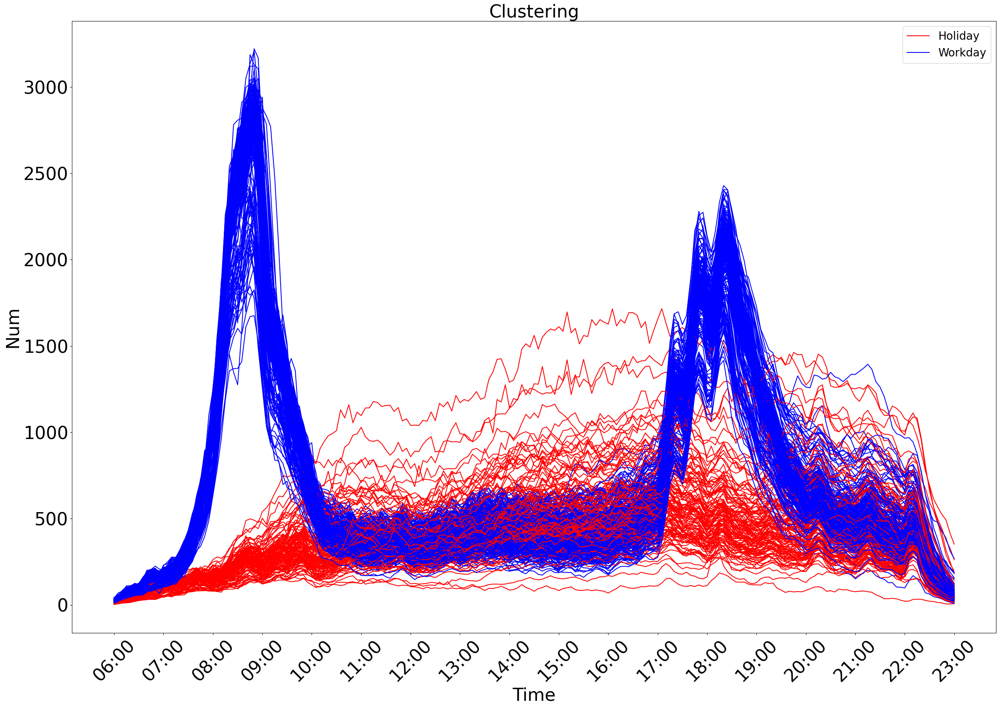

In [20]:
import numpy as np
import warnings
warnings.filterwarnings("ignore")
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
color=[
'r',
'b',
'g',
'y',
]
tms = []
for i in range(6,23):
    for j in range(0,60,5):
        tms.append(str(i).zfill(2)+':'+str(j).zfill(2))
tms.append('23:00')
def show(X, labels, label_name, name):
    plt.rcParams.update({"font.size":20})
    plt.figure(1,figsize=(30,20))
    x_major_locator=plt.MultipleLocator(12)
    ax=plt.gca()
    ax.xaxis.set_major_locator(x_major_locator)
    plt.title(name,fontsize=32)
    plt.xlabel("Time",fontsize=32)
    plt.ylabel("Num",fontsize=32)
    plt.xticks(fontsize=32,rotation=45)
    plt.yticks(fontsize=32)
    for i in range(len(label_name)):
        sns.lineplot(x=['06:00'],y=[0],color=color[i], label=label_name[i])
    for i in range(len(X)):
        c = color[labels[i]]
        sns.lineplot(x=tms,y=X[i],color=c)
    plt.savefig(f'./resources/{name}.jpg')
    plt.show()

show(x_all_ma5, labels_2, ['Holiday','Workday',], 'Clustering')

Time Series Feature Extraction based on Box-plot and IQR Method

0.9571265243902439


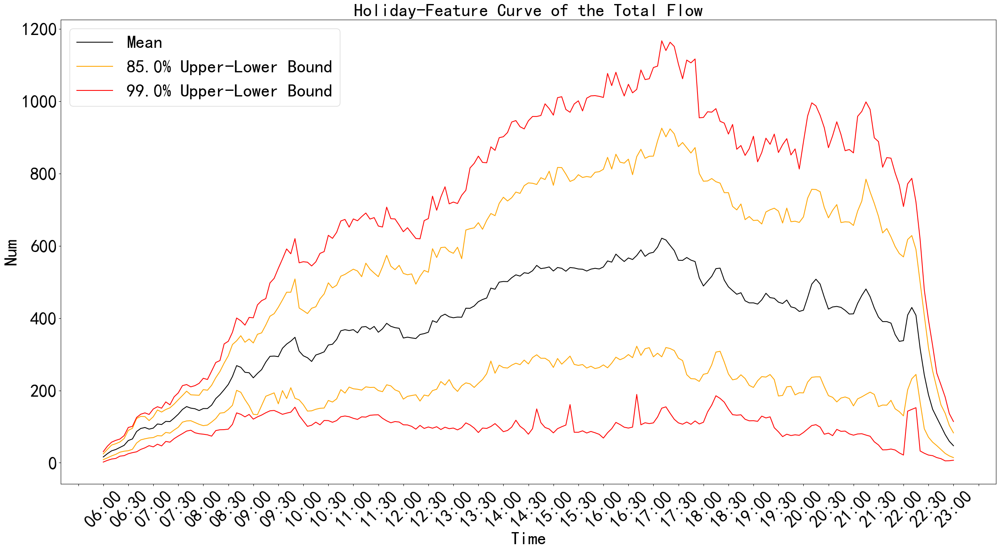

0.9473607571896616


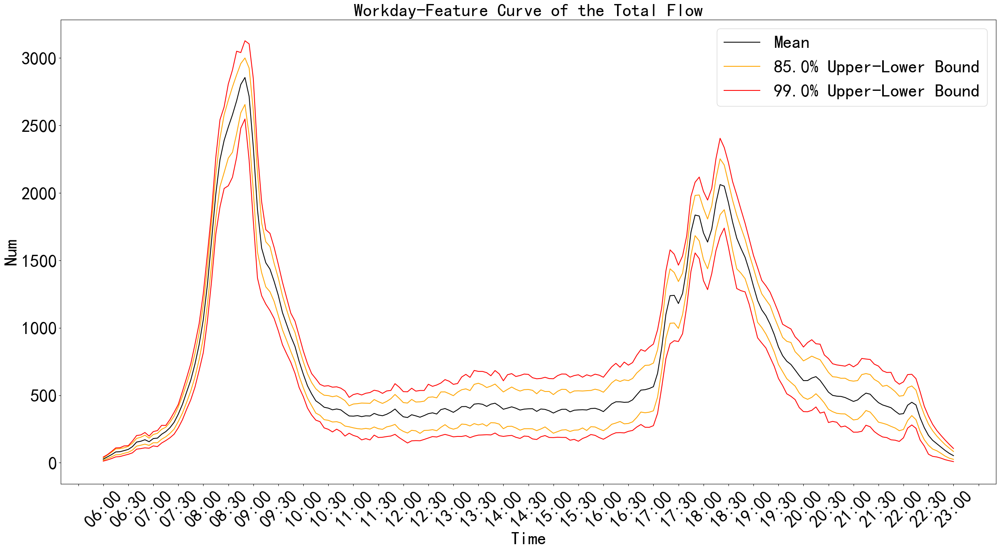

0.9622332317073171


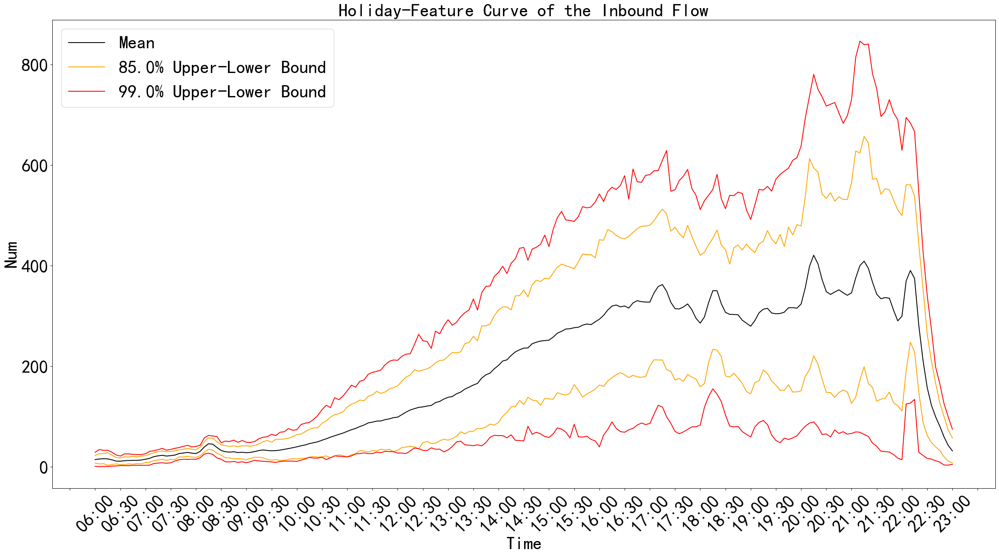

0.9617218784128141


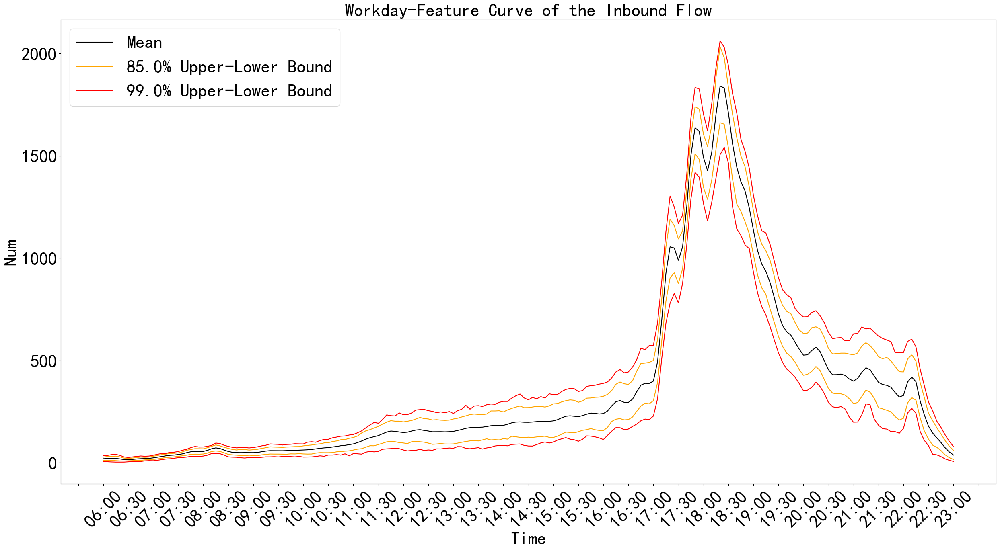

0.953125


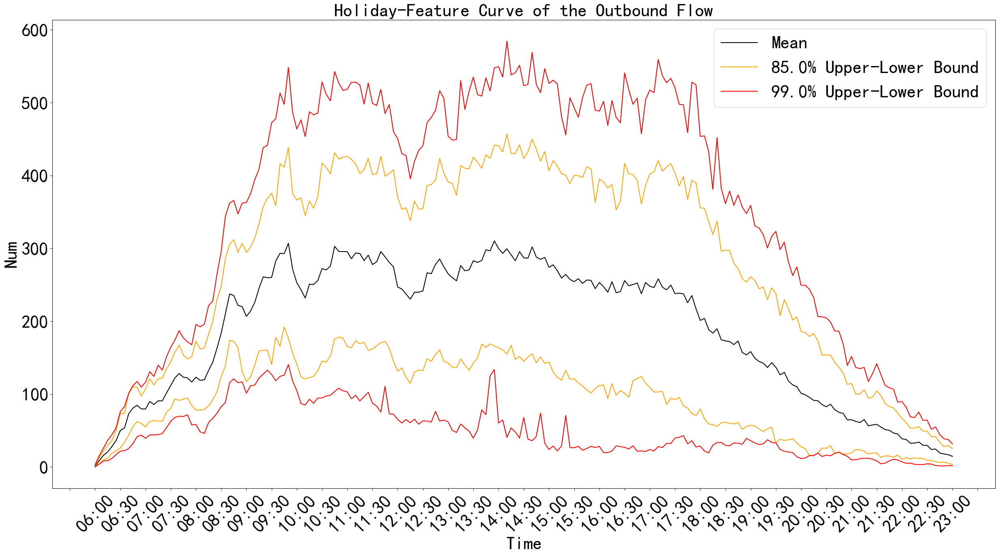

0.9574808882417182


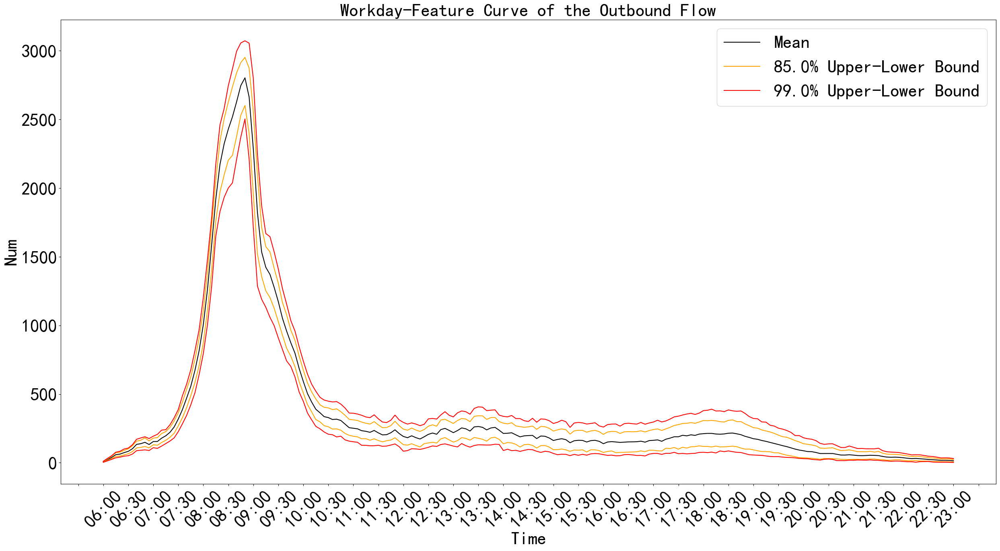

In [22]:
from scipy.stats import norm
def get_m(P,m=0,s=1):
    fi = (P+1)/2
    x = norm.ppf(fi,loc=m,scale=s)
    m = (x-0.6745)/1.349
    return m

def xiangxian(xx, name, p):
    ltms = tms*xx.shape[0]
    mean = []
    up_1 = []
    down_1 = []
    up_2 = []
    down_2 = []
    m = [get_m(p[0]),get_m(p[1])]
    ms=[]
    for i in range(xx.shape[1]):
        s = pd.Series(sorted(xx[:,i]))
        m = [get_m(p[0]),get_m(p[1])]
        iqr = s.quantile(0.75) - s.quantile(0.25)
        up_1.append(min(s.quantile(0.75) + m[0]*iqr,s[s<s.quantile(0.75) + m[0]*iqr].max()))
        down_1.append(max(s.quantile(0.25) - m[0]*iqr,s[s>s.quantile(0.25) - m[0]*iqr].min()))
        up_2.append(min(s.quantile(0.75) + m[1]*iqr,s[s<s.quantile(0.75) + m[1]*iqr].max()))
        down_2.append(max(s.quantile(0.25) - m[1]*iqr,s[s>s.quantile(0.25) - m[1]*iqr].min()))
        x_ = sorted(xx[:,i])
        imin = 0
        imax = len(x_)
        for i in range(imax):
            if x_[i]>=down_2[-1]:
                imin=i
                break
        for i in range(imax-1,0,-1):
            if x_[i]<=up_2[-1]:
                imax=i+1
                break
        mean.append(np.array(x_[imin:imax]).mean())
        ms.append((imax-imin)/len(x_))
    print(np.array(ms).mean())
    plt.rcParams['font.family'] = ['sans-serif']
    plt.rcParams.update({"font.size":32})
    plt.figure(1,figsize=(30,15))
    plt.title(name,fontsize=32)
    plt.xlabel("Time",fontsize=32)
    plt.ylabel("Num",fontsize=32)
    plt.xticks(fontsize=32,rotation=45)
    plt.yticks(fontsize=32)
#     sns.boxplot(x=ltms, y=xx.reshape(-1),whis=m[0],autorange=True)
    x_major_locator=plt.MultipleLocator(6)
    ax=plt.gca()
    ax.xaxis.set_major_locator(x_major_locator)
    sns.lineplot(x=tms,y=mean,color='black')
    sns.lineplot(x=tms,y=up_1,color='orange')
    sns.lineplot(x=tms,y=down_1,color='orange')
    sns.lineplot(x=tms,y=up_2,color='r')
    sns.lineplot(x=tms,y=down_2,color='r')
    sns.lineplot(x=['06:00'],y=[0],color='black', label='Mean')
    sns.lineplot(x=['06:00'],y=[0],color='orange', label=f'{p[0]*100}% Upper-Lower Bound')
    sns.lineplot(x=['06:00'],y=[0],color='r', label=f'{p[1]*100}% Upper-Lower Bound')
    plt.savefig(f'./resources/{name}.jpg')
    plt.show()
    data = dict(mean=mean,up_1=up_1,down_1=down_1,up_2=up_2,down_2=down_2)
    f = open(f'{name}.txt','w')
    f.write(str(data))
    f.close()

name = ['Holiday','Workday']
X = []
for i in range(2):
    X.append(np.array(x_all_ma5)[np.array(labels_2)==i])
for i in range(2):
    xiangxian(X[i],f'{name[i]}-Feature Curve of the Total Flow',[0.85,0.99])
X = []
for i in range(2):
    X.append(np.array(x_in_ma5)[np.array(labels_2)==i])
for i in range(2):
    xiangxian(X[i],f'{name[i]}-Feature Curve of the Inbound Flow',[0.85,0.99])
X = []
for i in range(2):
    X.append(np.array(x_out_ma5)[np.array(labels_2)==i])
for i in range(2):
    xiangxian(X[i],f'{name[i]}-Feature Curve of the Outbound Flow',[0.85,0.99])